<a href="https://colab.research.google.com/github/BagusWichaksono/PCVK_Ganjil_2026/blob/main/Modul3_PraktikumD1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Modul 3 — D1. Operasi Citra Sederhana

Langkah-langkah praktikum pengolahan citra digital meliputi kecerahan, kontras, grayscaling, masking, hingga perbaikan citra.

In [8]:
# Langkah 2: Mengakses folder images pada Google Drive
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Langkah 3: Transformasi Linier Brightness
* **Tujuan**: Mengubah tingkat kecerahan citra.
* **Formula**: $g(x,y) = f(x,y) + b$
* **Penjelasan**: Operasi menambahkan nilai konstanta $b$ pada setiap piksel. Fungsi `np.clip` digunakan untuk *truncate* agar nilai piksel tetap berada dalam rentang 0-255.

Mengubah tingkat kecerahan citra
--------------------------------
Masukkan nilai kecerahan: 30


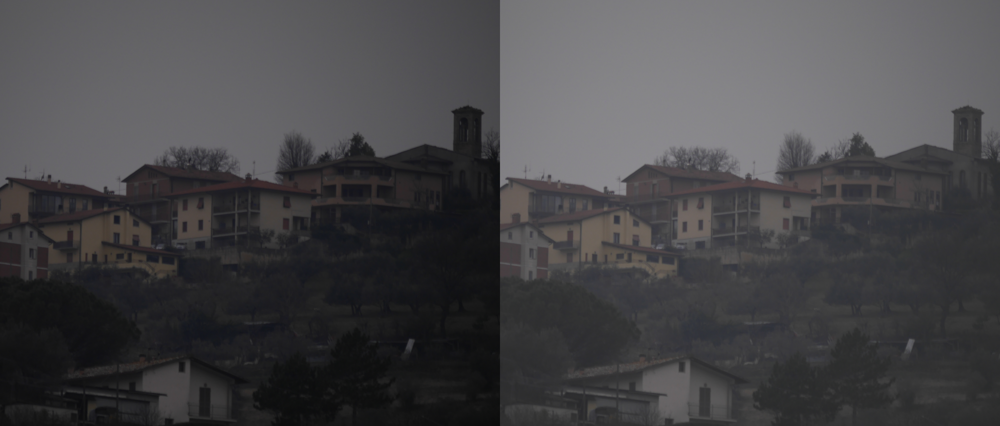

In [9]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np

print('Mengubah tingkat kecerahan citra')
print('--------------------------------')

try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

# Sesuaikan dengan file dan folder di drive Anda
original = cv.imread(
    '/content/drive/MyDrive/PCVK/houses.jpg'
)

brightness_image = np.zeros(original.shape, original.dtype)

# Akses per piksel
# np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y, x, c] = np.clip(
          original[y, x, c] + brightness, 0, 255
      )

# Cara simple tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)